In [1]:
%matplotlib notebook

In [2]:

import numpy as np

plt.rc('font', family='serif')

def show_gif(fname):
    import base64
    from IPython import display
    with open(fname, 'rb') as fd:
        b64 = base64.b64encode(fd.read()).decode('ascii')
    return display.HTML(f'<img src="data:image/gif;base64,{b64}" />')

In [3]:
from multidynet.datasets import load_icews

Y, countries, layer_labels, time_labels = load_icews(dataset='large', country_names='full')

Conditioned on the model parameters, the latent space model assumes dyads form as independent Bernoulli random variables with connection probability

$$
\text{logit}[\mathbb{P}(Y_{ijt}^k = 1)] = \delta_{k,t}^i + \delta_{k,t}^j + \mathbf{X}_t^{i \, \rm T}\Lambda_k \mathbf{X}_t^j
$$

In [4]:
np.where(time_labels == 'Feb 2011')[0][0]

25

In [4]:
import joblib

#joblib.dump(model, open('icews_test.pkl', 'wb'))
#model = joblib.load(open('icews-model_2009-2017_time_varying_degree.pkl', 'rb'))
#model = joblib.load(open('icews-model_2009-2017_reference.pkl', 'rb'))
#model = joblib.load(open('icews-model_2009-2017_time_varying_degree.pkl', 'rb'))
#model = joblib.load(open('icews-model_2009-2017_newprior.pkl', 'rb'))
model = joblib.load(open('icews-model_2009-2017_identify_n100_new.pkl', 'rb'))

In [30]:
time_labels[37:65]
time_slice = slice(37, 74)
time_labels[time_slice]

Index(['Feb 2012', 'Mar 2012', 'Apr 2012', 'May 2012', 'Jun 2012', 'Jul 2012',
       'Aug 2012', 'Sep 2012', 'Oct 2012', 'Nov 2012', 'Dec 2012', 'Jan 2013',
       'Feb 2013', 'Mar 2013', 'Apr 2013', 'May 2013', 'Jun 2013', 'Jul 2013',
       'Aug 2013', 'Sep 2013', 'Oct 2013', 'Nov 2013', 'Dec 2013', 'Jan 2014',
       'Feb 2014', 'Mar 2014', 'Apr 2014', 'May 2014', 'Jun 2014', 'Jul 2014',
       'Aug 2014', 'Sep 2014', 'Oct 2014', 'Nov 2014', 'Dec 2014', 'Jan 2015',
       'Feb 2015'],
      dtype='object')

In [31]:
from multidynet.plots import make_network_animation

countries_old = countries.copy()
countries[np.where(countries_old == 'Democratic Republic of Congo')[0]] = 'Congo'

node_colors = ['gray' for c in countries]
node_colors[int(np.where(countries == 'Ukraine')[0])] = 'steelblue'
node_colors[int(np.where(countries == 'Russia')[0])] = 'red'
node_colors = np.asarray(node_colors)
calpha = np.asarray([0.5 if n == 'Ukraine' or n == 'Russia' else 0.1 for n in countries])

time_slice = slice(37, 74)

make_network_animation('new_short.gif', Y[:, time_slice], model.Z_[time_slice], model.Z_sigma_[time_slice], k=3, tau_sq=model.tau_sq_, normalize=False,
                  size=50, with_labels=True, font_size=12, node_labels=countries, time_labels=time_labels[time_slice],
                  edge_width=0, figsize=(14, 15), layer_labels=layer_labels, node_color=node_colors,
                  contour_alpha=calpha, title_fmt=None, duration=0.2)


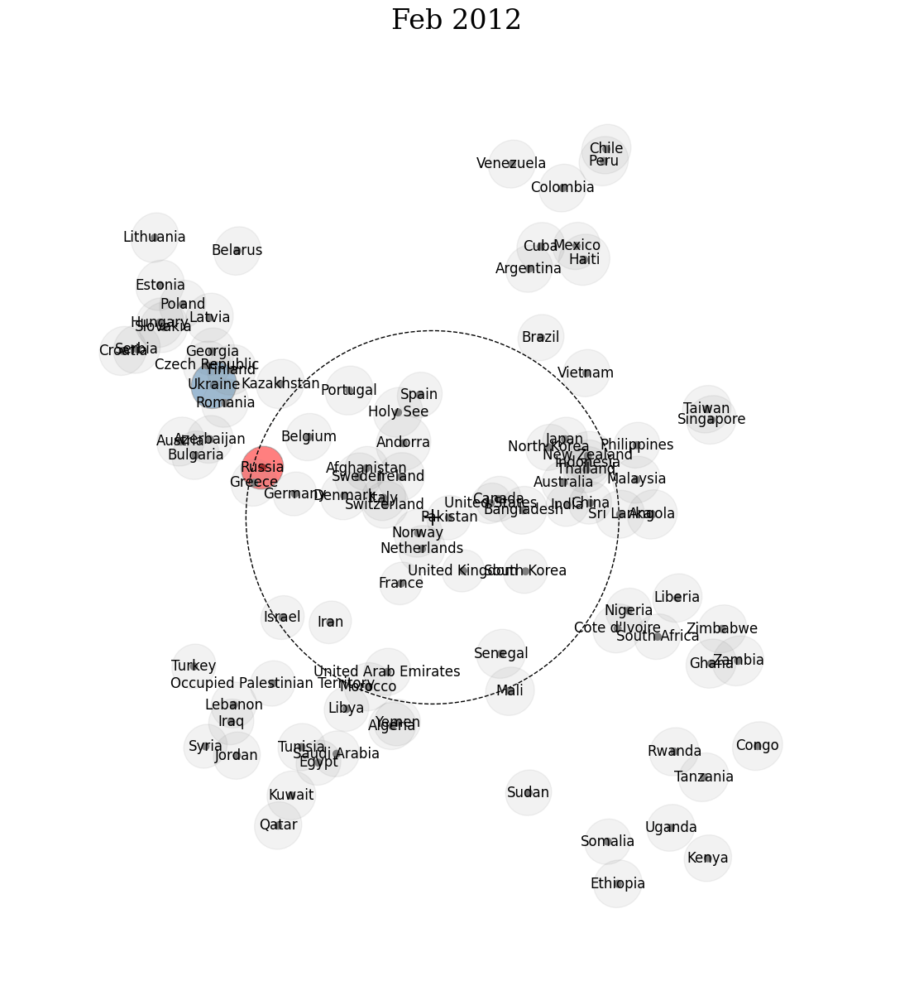

In [32]:
show_gif('new_short.gif')

In [33]:
from multidynet.plots import make_network_animation

countries_old = countries.copy()
countries[np.where(countries_old == 'Democratic Republic of Congo')[0]] = 'Congo'

node_colors = ['gray' for c in countries]
node_colors[int(np.where(countries == 'Ukraine')[0])] = 'steelblue'
node_colors[int(np.where(countries == 'Russia')[0])] = 'red'
node_colors = np.asarray(node_colors)
calpha = np.asarray([0.5 if n == 'Ukraine' or n == 'Russia' else 0.1 for n in countries])


make_network_animation('new.gif', Y, model.Z_, model.Z_sigma_, k=3, tau_sq=model.tau_sq_, normalize=False,
                  size=50, with_labels=True, font_size=12, node_labels=countries, time_labels=time_labels,
                  edge_width=0, figsize=(14, 15), layer_labels=layer_labels, node_color=node_colors,
                  contour_alpha=calpha, title_fmt=None, duration=0.2)

In [5]:
model.auc_

0.8981053677449428

In [14]:
Y_sim[3,0].mean()

0.2203550295857988

In [15]:
Y[3,0].mean()

0.10035502958579881

<IPython.core.display.Javascript object>


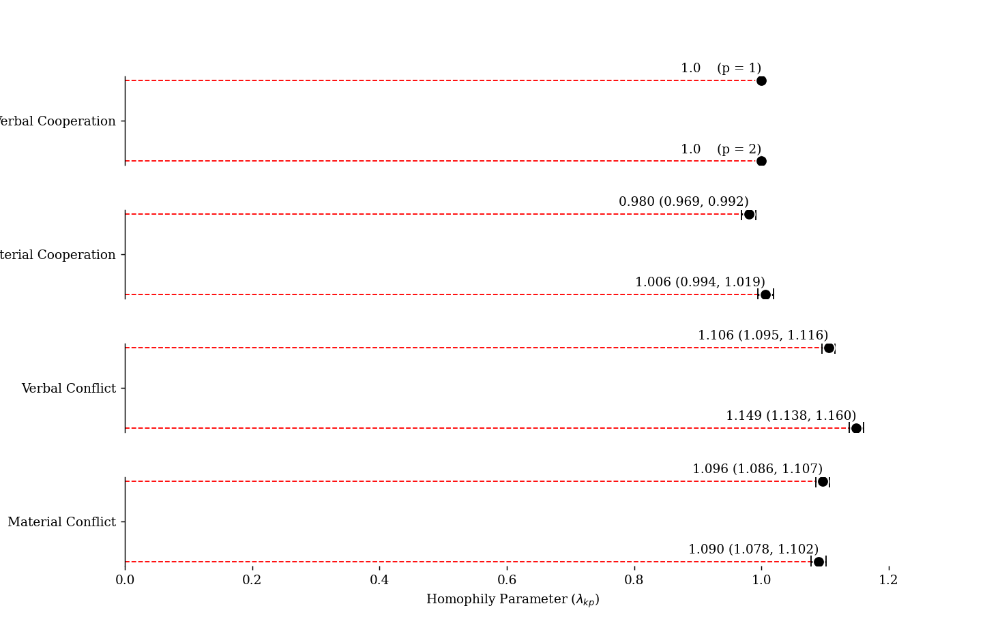

In [6]:
from multidynet.plots import plot_homophily_matrix

fig, axes = plot_homophily_matrix(
    model, q_alpha=0.05, hspace=1.0,
    layer_labels=layer_labels, fontsize=10,
    figsize=(11, 7))

#fig.savefig(
#    '/Users/joshua/Documents/StatisticsUIUC/JournalClub/dynamic-network-research/images/'
#    'icews_homophily.png', dpi=300)

<IPython.core.display.Javascript object>


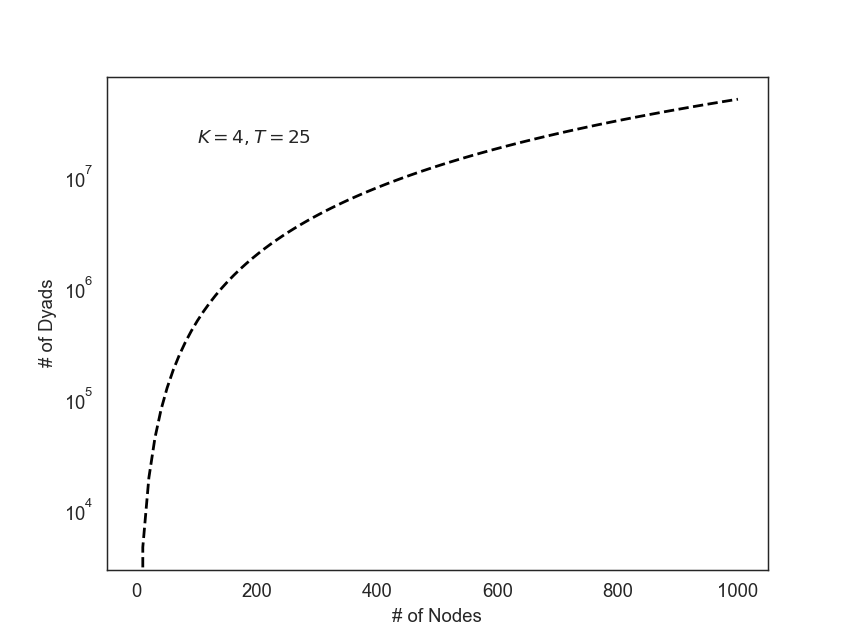

Text(100, 20000000, '$K = 4, T = 25$')

In [76]:
x = np.linspace(0, 1000, 100)
T = 25
K = 4

sns.set_style('white')
plt.semilogy(x, 0.5 * x * (x - 1) * K * T, 'k--')
#plt.yticks([0, 10, 100], visible=True)
plt.xlabel('# of Nodes')
plt.ylabel('# of Dyads')
plt.text(100,  2 * 10**7, '$K = 4, T = 25$')

#plt.savefig('/Users/joshua/Documents/StatisticsUIUC/JournalClub/dynamic-network-research/images/'
#            'scaling.png', dpi=300)

In [ ]:
from multidynet import DynamicMultilayerNetworkLSM
from multidynet.model_selection import train_test_split


model3 = DynamicMultilayerNetworkLSM(max_iter=500, n_features=0,
                                    #a=4.0, b=20.0, c=20, d=2.0, 
                                    a=2., b=2., c=2., d=2.,
                                    a_delta=2., b_delta=2., c_delta=2., d_delta=2.,
                                    lambda_var_prior=10., 
                                    lambda_odds_prior=1,
                                    tol=1e-2,
                                    n_jobs=-1,
                                    n_init=8,
                                    random_state=123)
model3.fit(Y)

In [18]:
model3.auc_

0.862953229473346

In [44]:
1 - 1/16.

0.9375

## Material Conflict

<IPython.core.display.Javascript object>


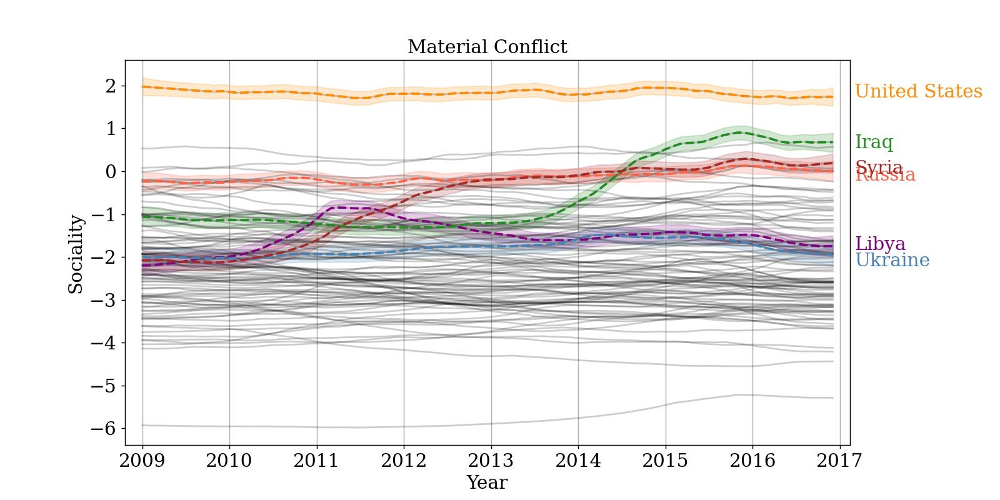

In [16]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 3

fig, ax = plot_social_trajectories(model, k=k, 
                 #ref_value=ref_value, ref_label=r'$\hat{\beta}_k$',
                 ref_value=None,
                 node_list=['United States', 'Russia', 'Libya', 'Iraq',
                            'Ukraine', 'Syria'], 
                 node_colors=['darkorange', 'tomato', 'purple', 'forestgreen',
                              'steelblue', 'brown'],
                 node_labels=countries, layer_label=layer_labels[k], xlabel='Year',
                 line_width=2, label_offset=2, alpha=0.2, fontsize=16,
                 figsize=(12, 6))

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.margins(x=0.025)
ax.grid(axis='x')
fig.subplots_adjust(right=0.85)


fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
            'social_trajectories_military_conflict.pdf', dpi=100, bbox_inches='tight')

# Verbal Cooperation

<IPython.core.display.Javascript object>


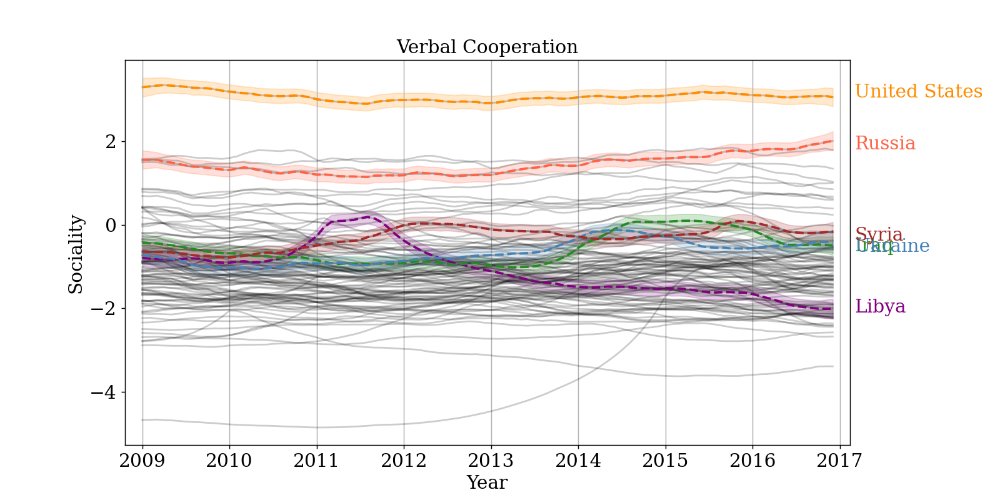

In [17]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 0

fig, ax = plot_social_trajectories(model, k=k, 
                 #ref_value=ref_value, ref_label=r'$\hat{\beta}_k$',
                 ref_value=None,
                 node_list=['United States', 'Russia', 'Libya', 'Iraq',
                            'Ukraine', 'Syria'], 
                 node_colors=['darkorange', 'tomato', 'purple', 'forestgreen',
                              'steelblue', 'brown'],
                 node_labels=countries, layer_label=layer_labels[k], xlabel='Year',
                 line_width=2, label_offset=2, alpha=0.2, fontsize=16,
                 figsize=(12, 6))

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.margins(x=0.025)
ax.grid(axis='x')
fig.subplots_adjust(right=0.85)

fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
            'social_trajectories_verbal_cooperation.pdf', dpi=100, bbox_inches='tight')

## Material Cooperation

<IPython.core.display.Javascript object>


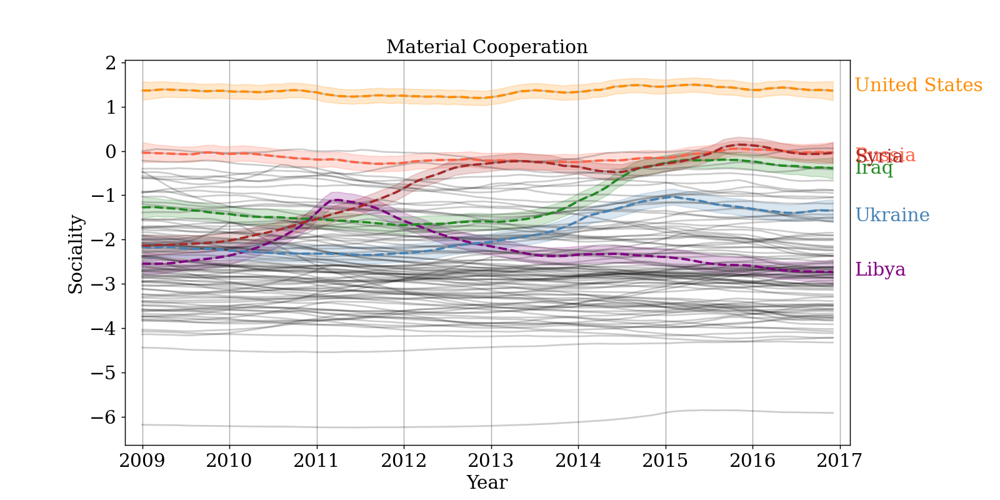

In [18]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 1

fig, ax = plot_social_trajectories(model, k=k, 
                 #ref_value=ref_value, ref_label=r'$\hat{\beta}_k$',
                 ref_value=None,
                 node_list=['United States', 'Russia', 'Libya', 'Iraq',
                            'Ukraine', 'Syria'], 
                 node_colors=['darkorange', 'tomato', 'purple', 'forestgreen',
                              'steelblue', 'brown'],
                 node_labels=countries, layer_label=layer_labels[k], xlabel='Year',
                 line_width=2, label_offset=2, alpha=0.2, fontsize=16,
                 figsize=(12, 6))

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.margins(x=0.025)
ax.grid(axis='x')
fig.subplots_adjust(right=0.85)

fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
            'social_trajectories_material_cooperation.pdf', dpi=100, bbox_inches='tight')

## Verbal Conflict

In [5]:
countries

array(['United States', 'United Kingdom', 'France', 'Australia', 'China',
       'India', 'Japan', 'South Korea', 'Russia', 'Canada',
       'South Africa', 'Brazil', 'Germany', 'Iran', 'Nigeria', 'Spain',
       'Egypt', 'Philippines', 'Turkey', 'Cuba', 'Israel', 'Italy',
       'New Zealand', 'Georgia', 'Vietnam', 'Libya', 'Netherlands',
       'Belgium', 'Switzerland', 'United Arab Emirates', 'Argentina',
       'Uganda', 'Occupied Palestinian Territory', 'Thailand', 'Kenya',
       'Qatar', 'North Korea', 'Pakistan', 'Indonesia', 'Morocco',
       'Latvia', 'Afghanistan', 'Austria', 'Mexico', 'Singapore',
       'Taiwan', 'Venezuela', 'Colombia', 'Iraq', 'Portugal', 'Algeria',
       'Norway', 'Saudi Arabia', 'Ethiopia', 'Ireland', 'Lithuania',
       'Syria', 'Azerbaijan', 'Sudan', 'Sweden', 'Ukraine', 'Romania',
       'Kuwait', 'Bulgaria', 'Holy See', 'Lebanon', 'Tunisia', 'Greece',
       'Chile', 'Angola', 'Czech Republic', 'Malaysia', 'Poland',
       'Somalia', 'Tanzania', '

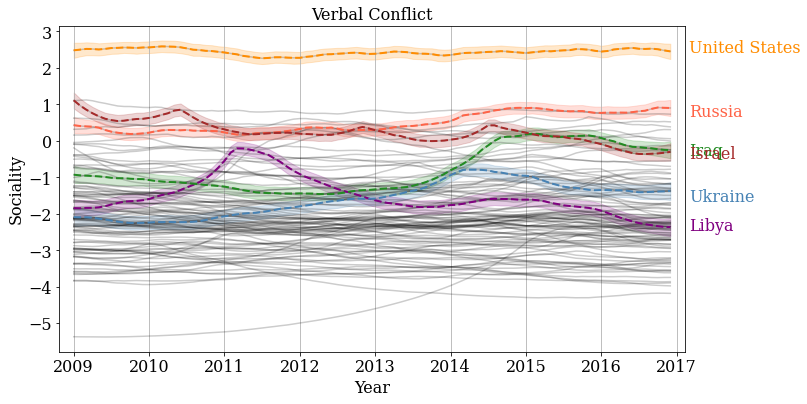

In [6]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 2

fig, ax = plot_social_trajectories(model, k=k, 
                 #ref_value=ref_value, ref_label=r'$\hat{\beta}_k$',
                 ref_value=None,
                 node_list=['United States', 'Russia', 'Libya', 'Iraq',
                            'Ukraine', 'Israel'],#'Syria'], 
                 node_colors=['darkorange', 'tomato', 'purple', 'forestgreen',
                              'steelblue', 'brown'],
                 node_labels=countries, layer_label=layer_labels[k], xlabel='Year',
                 line_width=2, label_offset=2, alpha=0.2, fontsize=16,
                 figsize=(12, 6))

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.margins(x=0.025)
ax.grid(axis='x')
fig.subplots_adjust(right=0.85)

#fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
#            'social_trajectories_verbal_conflict.pdf', dpi=100, bbox_inches='tight')

In [8]:
layer_labels

['Verbal Cooperation',
 'Material Cooperation',
 'Verbal Conflict',
 'Material Conflict']

In [13]:
from scipy.stats import invgamma

x_tau = invgamma.rvs(a=model.a_tau_sq_/2., scale=model.b_tau_sq_/2.,
                 size=20000)
np.quantile(np.sqrt(x_tau), q=[0.025, 0.5, 0.975])

array([0.82488925, 0.90747847, 1.00157513])

In [14]:
from scipy.stats import invgamma

x_tau = invgamma.rvs(a=model.c_sigma_sq_/2., scale=model.d_sigma_sq_/2.,
                 size=20000)
np.quantile(np.sqrt(x_tau), q=[0.025, 0.5, 0.975])

array([0.04330218, 0.04374053, 0.04419022])

In [12]:
from scipy.stats import invgamma

x_tau = invgamma.rvs(a=model.a_tau_sq_delta_/2., scale=model.b_tau_sq_delta_/2.,
                 size=20000)
np.quantile(x_tau, q=[0.025, 0.5, 0.975])

array([4.4222728 , 5.06661774, 5.83990051])

In [13]:
from scipy.stats import invgamma

x_tau = invgamma.rvs(a=model.c_sigma_sq_delta_/2., scale=model.d_sigma_sq_delta_/2.,
                 size=20000)
np.quantile(np.sqrt(x_tau), q=[0.025, 0.5, 0.975])

array([0.06189937, 0.06234463, 0.06279329])

<IPython.core.display.Javascript object>


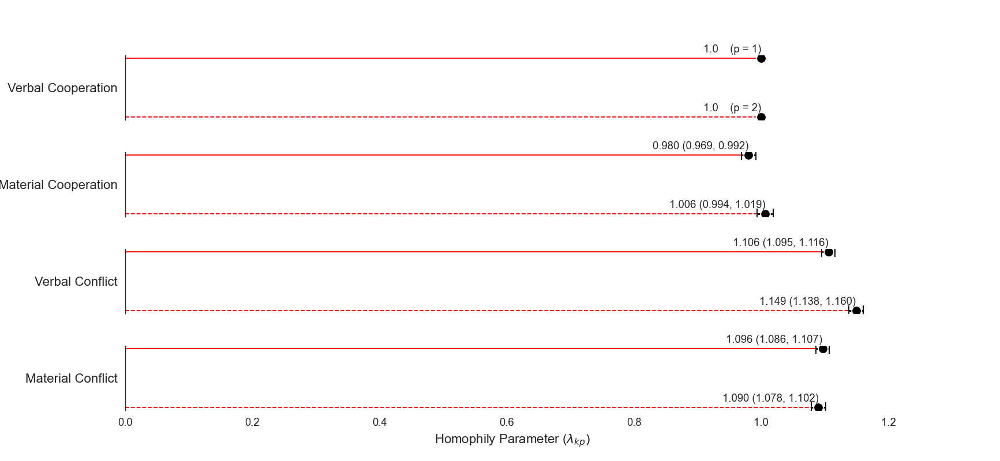

In [6]:
from multidynet.plots import plot_homophily_matrix

fig, axes = plot_homophily_matrix(
    model, q_alpha=0.05, 
    #colors=['gray', 'black', 'gray', 'black'],
    layer_labels=layer_labels, fontsize=12,
    figsize=(13, 6))

fig.savefig(
    '/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
    'icews_homophily_n100.png', dpi=100)

In [12]:
model.auc_

0.8981053677449428

<IPython.core.display.Javascript object>


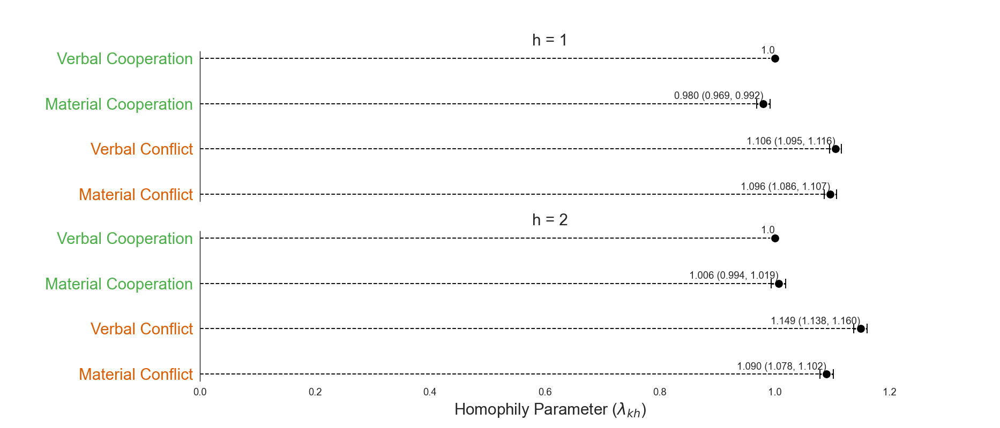

In [6]:
from multidynet.plots import plot_lambda

fig, axes = plot_lambda(model, q_alpha=0.05, layer_labels=layer_labels, fontsize=16,
                        figsize=(14, 6), include_gridlines=False, color_code=False)
fig.subplots_adjust(left=0.2)
#fig.savefig(
#    '/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
#    'icews_homophily_n100_p.pdf', dpi=100, bbox_inches='tight')

color = ['#4daf4a', '#4daf4a', '#d95f02', '#d95f02']
#color = ['green', 'green', 'steelblue', 'steelblue']#, 'tomato', 'tomato']
#color = ['#1b9e77', '#1b9e77', '#d95f02', '#d95f02']
for xtick, c in zip(axes[0].get_yticklabels(), color):
    xtick.set_color(c)
    
   
for xtick, c in zip(axes[1].get_yticklabels(), color):
    xtick.set_color(c)
    
fig.savefig(
    '/Users/joshua/Documents/StatisticsUIUC/prelim-presentation/images/'
    'icews_homophily.pdf', dpi=300, bbox_inches='tight')

In [29]:
axes

array([<matplotlib.axes._subplots.AxesSubplot object at 0x15d2c4850>,
      dtype=object)

<IPython.core.display.Javascript object>


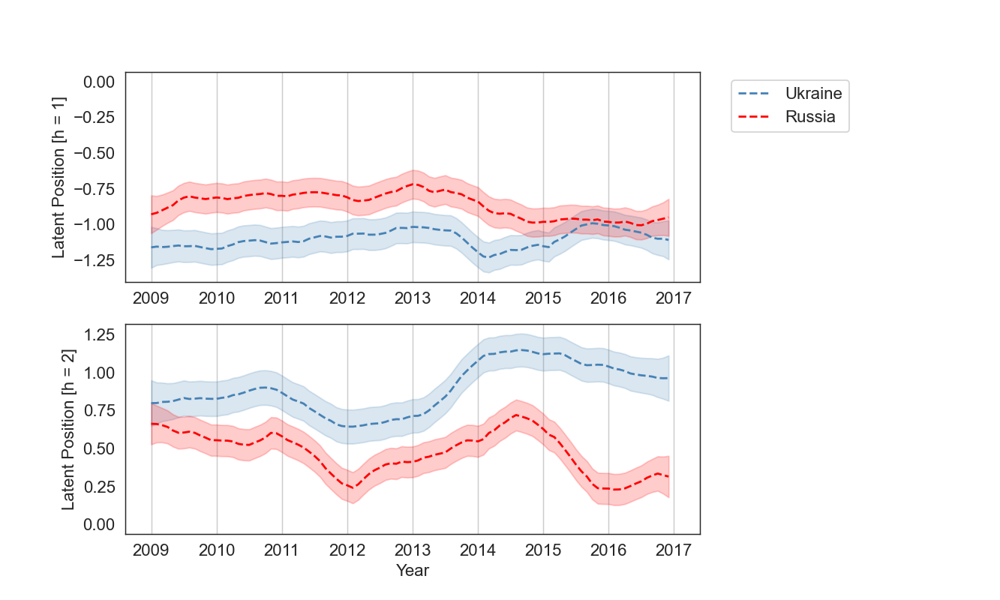

In [22]:
from multidynet.plots import plot_node_trajectories

fig, ax = plot_node_trajectories(model, ['Ukraine', 'Russia'],
                            node_colors=['steelblue', 'red', 'goldenrod', 'forestgreen'],
                            figsize=(10, 6), fontsize=12,
                            node_labels=countries, q_alpha=0.05, linestyle='--')

for p in range(2):
    ax[p].set_xticks([i * 12 for i in range(9)])
    ax[p].set_xticklabels([2009 + i for i in range(9)])
    ax[p].grid(axis='x')
ax[-1].set_xlabel('Year', fontsize=12)

#fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
#           'ukraine_russia_latent.pdf', dpi=100, bbox_inches='tight')

<IPython.core.display.Javascript object>


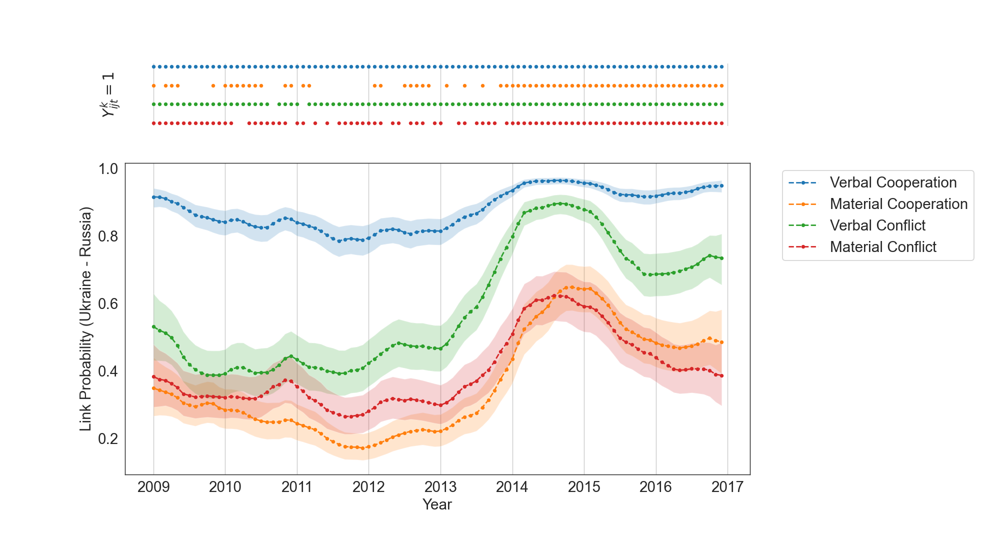

In [23]:
from multidynet.plots import plot_pairwise_probabilities

horizon=0

fig, axes = plt.subplots(figsize=(15,8), nrows=2, sharex=True,
                         gridspec_kw={'height_ratios': [1, 5]})
_, ax = plot_pairwise_probabilities(model, 'Ukraine', 'Russia', 
                                      node_labels=countries, horizon=horizon,
                                      linestyle='.--', figsize=(10, 6),
                                      layer_labels=layer_labels,
                                      ax=axes[1])

for k in range(Y.shape[0]):
    mask = Y[k, :, 60, 8] == 1
    axes[0].plot(np.arange(Y.shape[1])[mask], Y[k, :, 60, 8][mask] - k, '.')
    axes[0].set_yticks([])

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.grid(axis='x')
ax.set_xlabel('Year', fontsize=16)

axes[0].grid(axis='x')
[a.set_visible(False) for a in axes[0].spines.values()]
#axes[0].spines['top'].set_visible(False)
#axes[0].spines['bottom'].set_visible(False)

axes[0].set_ylabel('$Y_{ijt}^k = 1$', fontsize=16)
ax.tick_params(axis='y', labelsize=16)
axes[0].set_xlabel('')

if horizon > 0:
    ax.axvline(8 * 12, 0, 1, color='k', linestyle='dotted', lw=2)

fig.subplots_adjust(right=0.75)

fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
            'ukraine_russia.pdf', dpi=100, bbox_inches='tight')

<IPython.core.display.Javascript object>


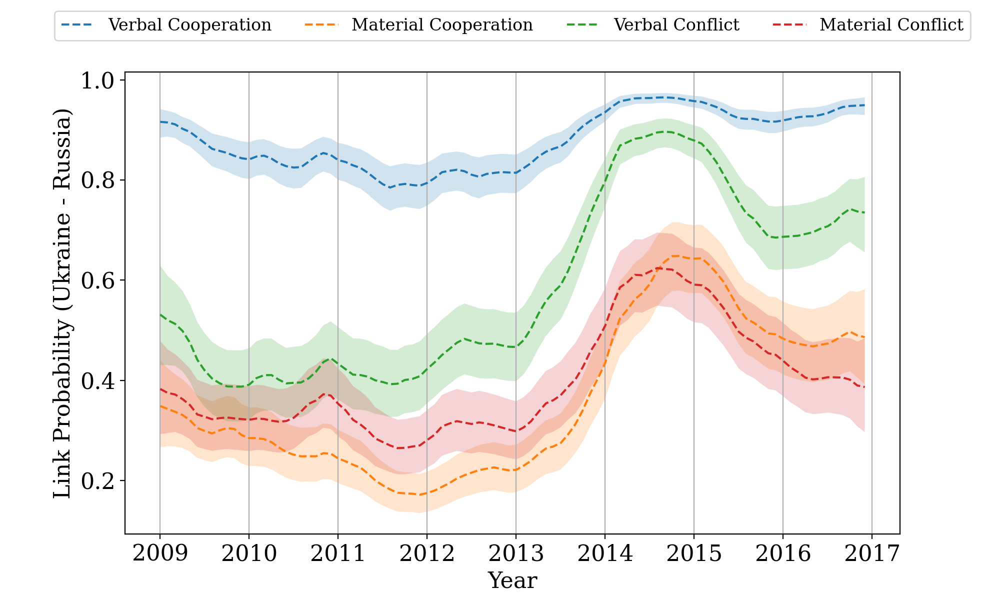

In [29]:
from multidynet.plots import plot_pairwise_probabilities

horizon=0

#fig, axes = plt.subplots(figsize=(15,8), nrows=1, sharex=True,
#                         gridspec_kw={'height_ratios': [1, 5]})
_, ax = plot_pairwise_probabilities(model, 'Ukraine', 'Russia', 
                                      node_labels=countries, horizon=horizon,
                                      linestyle='--', figsize=(10, 6),
                                      layer_labels=layer_labels)

#for k in range(Y.shape[0]):
#    mask = Y[k, :, 60, 8] == 1
#    axes[0].plot(np.arange(Y.shape[1])[mask], Y[k, :, 60, 8][mask] - k, '.')
#    axes[0].set_yticks([])

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.grid(axis='x')
ax.set_xlabel('Year', fontsize=16)

axes[0].grid(axis='x')
[a.set_visible(False) for a in axes[0].spines.values()]
#axes[0].spines['top'].set_visible(False)
#axes[0].spines['bottom'].set_visible(False)

axes[0].set_ylabel('$Y_{ijt}^k = 1$', fontsize=16)
ax.tick_params(axis='y', labelsize=16)
axes[0].set_xlabel('')

if horizon > 0:
    ax.axvline(8 * 12, 0, 1, color='k', linestyle='dotted', lw=2)
    
ax.legend(bbox_to_anchor=(0.5, 1.05), loc='lower center', fontsize=12, ncol=4)

fig.subplots_adjust(right=0.75)

#fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
#            'ukraine_russia.pdf', dpi=100, bbox_inches='tight')
plt.savefig('/Users/joshua/Documents/faculty-job-search/research-statement/images/'
            'ukraine_russia.pdf', dpi=100, bbox_inches='tight')

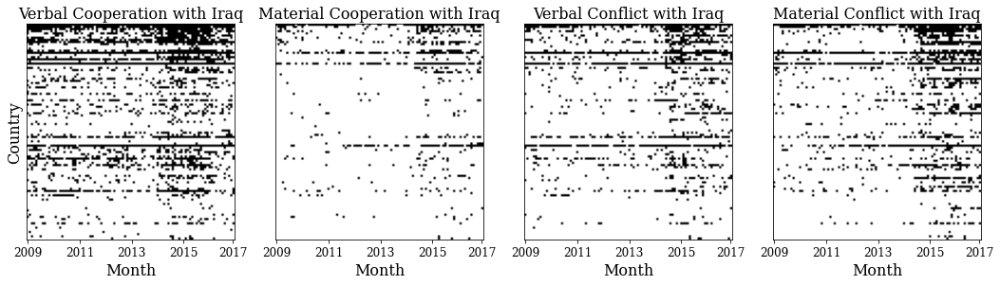

In [13]:
from dynetlsm.plots import plot_adjacency_matrix

k = 2
node_id = 48

fig, axes = plt.subplots(nrows=1, ncols=4, sharey=True, sharex=True, figsize=(18, 6))

for k, ax in enumerate(axes.flat):
    Yk = Y[k, :, node_id].T
    ax.imshow(Yk, cmap='gray_r')
    #ax.set_xlabel('Month')
    #ax.set_ylabel('Country')
    ax.set_title("{} with {}".format(layer_labels[k], countries[node_id]), fontsize=16)
    ax.set_yticks([])
    ax.set_xticks([i * 24 for i in range(4)] + [95])
    ax.set_xticklabels([2009 + 2 * i for i in range(4)] + [2017], fontsize=12)
    ax.set_xlabel('Month', fontsize=16)

axes[0].set_ylabel('Country', fontsize=16)
#axes[1, 0].set_ylabel('Country')
#axes[1, 0].set_xlabel('Month')
#axes[1, 1].set_xlabel('Month')

fig.savefig("/Users/joshua/test.pdf", dpi=300, bbox_inches='tight')
#fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
#            'iraq_networks2.pdf', dpi=100, bbox_inches='tight')

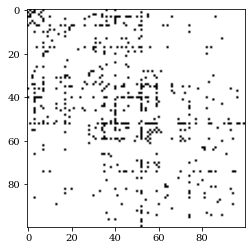

In [26]:
t = 25
k = 3
order = np.lexsort((model.X_[t, :, 0], model.X_[t, :, 1]))

plt.imshow(Y[k,t][order][:, order], cmap='gray_r')

<IPython.core.display.Javascript object>


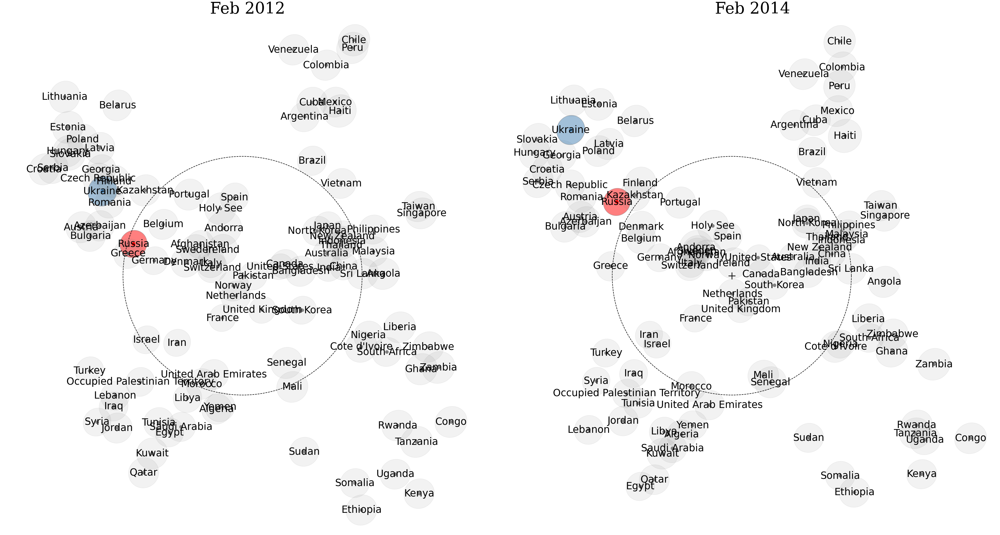

In [14]:
from multidynet.plots import plot_network, normal_contour

t = 37
k = 0

fig, ax= plt.subplots(figsize=(28, 15), ncols=2, sharey=True, constrained_layout=True)


countries[np.where(countries_old == 'Democratic Republic of Congo')[0]] = 'Congo'

node_colors = ['gray' for c in countries]
node_colors[int(np.where(countries == 'Ukraine')[0])] = 'steelblue'
node_colors[int(np.where(countries == 'Russia')[0])] = 'red'
node_colors = np.asarray(node_colors)

ax[0].autoscale(enable=True)

calpha = np.asarray([0.5 if n == 'Ukraine' or n == 'Russia' else 0.1 for n in countries])

plot_network(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t], 
                       #delta=model.delta_[k,t], 
                       tau_sq=model.tau_sq_, normalize=False,
                       with_labels=True, font_size=20,
                       node_labels=countries,
                       contour_alpha=calpha,
                       node_color=node_colors,
                       size=50, edge_width=0,
                       ax=ax[0])
ax[0].set_title('{}'.format(time_labels[t]), fontsize=32)

t = 61
plot_network(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t], 
                       #delta=model.delta_[k,t], 
                       tau_sq=model.tau_sq_, normalize=False,
                       with_labels=True, font_size=20,
                       node_labels=countries, 
                       contour_alpha=calpha,
                       node_color=node_colors,
                       size=50, edge_width=0,
                       ax=ax[1])
#ax[1].set_title('{} during {}'.format(layer_labels[k], time_labels[t]), fontsize=16)
ax[1].set_title('{}'.format(time_labels[t]), fontsize=32)
    
#fig.savefig('/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
#            'icews_network_2009.png', dpi=300)

#fig.tight_layout()
fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
            'icews_latent_color.pdf', dpi=100, bbox_inches='tight')

In [ ]:
from multidynet.plots import plot_network, normal_contour
from multidynet.plots import plot_lambda

t = 37
k = 0

fig, ax= plt.subplots(figsize=(28, 15), ncols=3, sharey=True, constrained_layout=True)


countries[np.where(countries_old == 'Democratic Republic of Congo')[0]] = 'Congo'

node_colors = ['gray' for c in countries]
node_colors[int(np.where(countries == 'Ukraine')[0])] = 'steelblue'
node_colors[int(np.where(countries == 'Russia')[0])] = 'red'
node_colors = np.asarray(node_colors)

ax[0].autoscale(enable=True)

calpha = np.asarray([0.5 if n == 'Ukraine' or n == 'Russia' else 0.1 for n in countries])

plot_network(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t], 
                       #delta=model.delta_[k,t], 
                       tau_sq=model.tau_sq_, normalize=False,
                       with_labels=True, font_size=20,
                       node_labels=countries,
                       contour_alpha=calpha,
                       node_color=node_colors,
                       size=50, edge_width=0,
                       ax=ax[0])
ax[0].set_title('{}'.format(time_labels[t]), fontsize=32)

t = 61
plot_network(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t], 
                       #delta=model.delta_[k,t], 
                       tau_sq=model.tau_sq_, normalize=False,
                       with_labels=True, font_size=20,
                       node_labels=countries, 
                       contour_alpha=calpha,
                       node_color=node_colors,
                       size=50, edge_width=0,
                       ax=ax[1])
#ax[1].set_title('{} during {}'.format(layer_labels[k], time_labels[t]), fontsize=16)
ax[1].set_title('{}'.format(time_labels[t]), fontsize=32)
    
#fig.savefig('/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
#            'icews_network_2009.png', dpi=300)

#fig.tight_layout()
fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
            'icews_latent_color.pdf', dpi=100, bbox_inches='tight')

In [ ]:
from multidynet.plots import plot_lambda

fig, axes = plot_lambda(model, q_alpha=0.05, layer_labels=layer_labels, fontsize=16,
                        figsize=(14, 6), include_gridlines=False, color_code=False)
fig.subplots_adjust(left=0.2)
#fig.savefig(
#    '/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
#    'icews_homophily_n100_p.pdf', dpi=100, bbox_inches='tight')

color = ['#4daf4a', '#4daf4a', '#d95f02', '#d95f02']
#color = ['green', 'green', 'steelblue', 'steelblue']#, 'tomato', 'tomato']
#color = ['#1b9e77', '#1b9e77', '#d95f02', '#d95f02']
for xtick, c in zip(axes[0].get_yticklabels(), color):
    xtick.set_color(c)
    
   
for xtick, c in zip(axes[1].get_yticklabels(), color):
    xtick.set_color(c)

In [10]:
countries[np.argsort(Y[0, 0].sum(axis=0))[::-1]]

array(['United States', 'Occupied Palestinian Territory', 'Israel',
       'China', 'Russia', 'France', 'United Kingdom', 'Iran', 'Turkey',
       'South Korea', 'Japan', 'India', 'Spain', 'Egypt',
       'Czech Republic', 'Germany', 'Italy', 'Australia', 'Qatar',
       'Belgium', 'Sudan', 'Iraq', 'Switzerland', 'Indonesia', 'Syria',
       'Bangladesh', 'Afghanistan', 'Pakistan', 'Saudi Arabia', 'Vietnam',
       'Azerbaijan', 'Yemen', 'Ukraine', 'Jordan', 'Lithuania', 'Austria',
       'United Arab Emirates', 'Libya', 'Poland', 'South Africa',
       'Georgia', 'Thailand', 'Romania', 'Lebanon', 'Greece', 'Ghana',
       'Brazil', 'Canada', 'Netherlands', 'Nigeria', 'Portugal',
       'Bulgaria', 'Kuwait', 'Colombia', 'Mexico', 'Serbia', 'Uganda',
       'Cuba', 'Malaysia', 'Kenya', 'Venezuela', 'Philippines',
       'Kazakhstan', 'Algeria', 'Ethiopia', 'Latvia', 'Tunisia',
       'Belarus', 'Sweden', 'Finland', 'Holy See', 'Angola', 'Morocco',
       'Slovakia', 'Rwanda', 'Senegal',

In [5]:
countries[np.argsort(Y[2, 25].sum(axis=0))[::-1]]

array(['United States', 'Egypt', 'Libya', 'United Kingdom', 'Iran',
       'France', 'Russia', 'Germany', 'China', 'Israel',
       'Occupied Palestinian Territory', 'India', 'South Korea',
       'Australia', 'Japan', 'Afghanistan', 'Canada', 'Italy', 'Tunisia',
       "Cote d'Ivoire", 'Turkey', 'Iraq', 'Somalia', 'Lebanon', 'Austria',
       'South Africa', 'Belarus', 'Ireland', 'Switzerland', 'Philippines',
       'Jordan', 'Sudan', 'Spain', 'Belgium', 'Thailand',
       'United Arab Emirates', 'Syria', 'Kenya', 'Indonesia', 'Malaysia',
       'Netherlands', 'Czech Republic', 'Poland', 'Qatar', 'Romania',
       'Pakistan', 'North Korea', 'Yemen', 'Saudi Arabia', 'Algeria',
       'Sweden', 'Brazil', 'Venezuela', 'Morocco', 'Mexico', 'Ukraine',
       'Cuba', 'Uganda', 'New Zealand', 'Bulgaria', 'Georgia', 'Nigeria',
       'Portugal', 'Serbia', 'Taiwan', 'Senegal', 'Finland', 'Croatia',
       'Singapore', 'Denmark', 'Greece', 'Chile', 'Peru', 'Liberia',
       'Zimbabwe', 'Hungary

In [20]:
time_labels[25]

'Feb 2011'

In [ ]:
from drforest.plots import plot_local_importance, plot_single_importance

imp = np.array([0.5, 0.25, -0.1, 0])


plot_single_importance(imp)

In [30]:
?plot_single_importance